## Data Preprocessing 

### 1) Exploratory Data Analysis

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from collections import Counter
from IPython.core.display import display, HTML
import category_encoders as ce
from sklearn.model_selection import train_test_split
sns.set_style('white')

VW = pd.read_csv('vw.csv')

print('\n'"*** ↑↑↑ Data Info: ↑↑↑ ***"'\n''\n', VW.info())

print('\n'"*** ↓↓↓ Data Description: ↓↓↓ ***"'\n''\n', VW.describe())

print('\n'"*** ↓↓↓ Target (Price) Description: ↓↓↓ ***"'\n''\n', VW.price.describe(percentiles = [0.25,0.50,0.75,0.85,0.90,1]))


# NAN ************************************************************************

print('\n'"*** ↓↓↓ NAN Data: ↓↓↓ ***"'\n''\n',VW.isnull().sum())


# Outliers *******************************************************************

VW_num = VW.iloc[:,[2,4,6,7,8]]
for k, v in VW_num.items():
    q1 = v.quantile(0.25)
    q3 = v.quantile(0.75)
    irq = q3 - q1
    v_col = v[(v <= q1 - 1.5 * irq) | (v >= q3 + 1.5 * irq)]
    perc = np.shape(v_col)[0] * 100.0 / np.shape(VW_num)[0]
    print("*** ➞ Column %s outliers = %.2f%%" % (k, perc))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15157 entries, 0 to 15156
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         15157 non-null  object 
 1   year          15157 non-null  int64  
 2   price         15157 non-null  int64  
 3   transmission  15157 non-null  object 
 4   mileage       15157 non-null  int64  
 5   fuelType      15157 non-null  object 
 6   tax           15157 non-null  int64  
 7   mpg           15157 non-null  float64
 8   engineSize    15157 non-null  float64
dtypes: float64(2), int64(4), object(3)
memory usage: 1.0+ MB

*** ↑↑↑ Data Info: ↑↑↑ ***

 None

*** ↓↓↓ Data Description: ↓↓↓ ***

                year         price        mileage           tax           mpg  \
count  15157.000000  15157.000000   15157.000000  15157.000000  15157.000000   
mean    2017.255789  16838.952365   22092.785644    112.744277     53.753355   
std        2.053059   7755.015206   21148.941

### 2) Data Visualization 

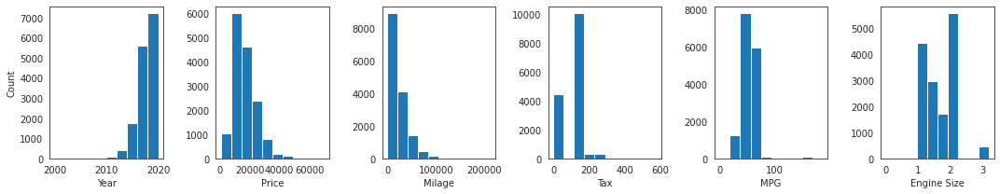

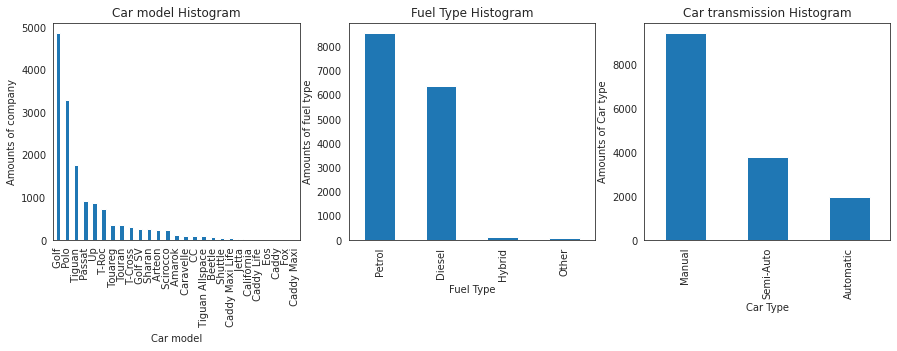

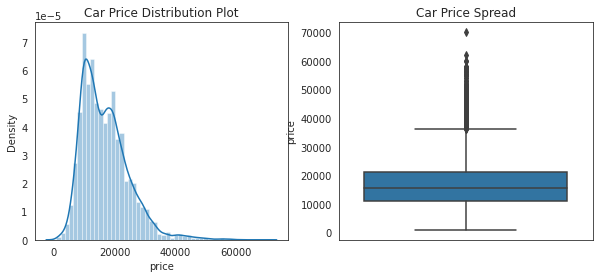

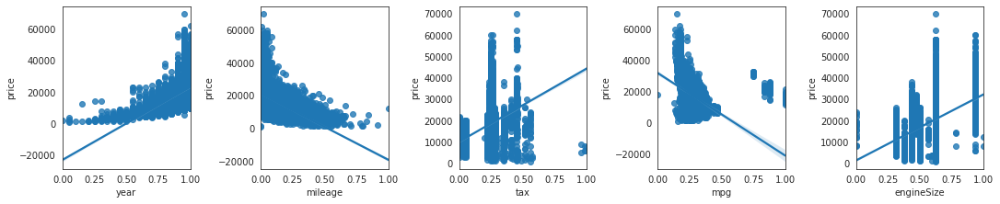

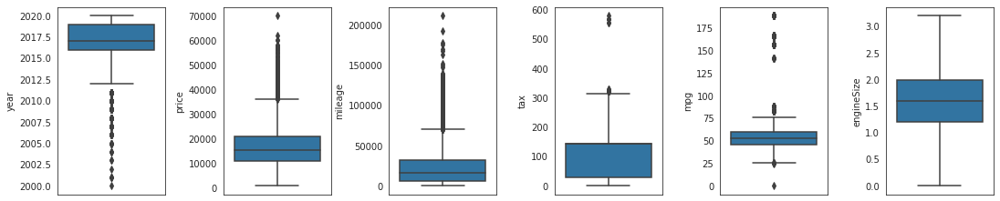

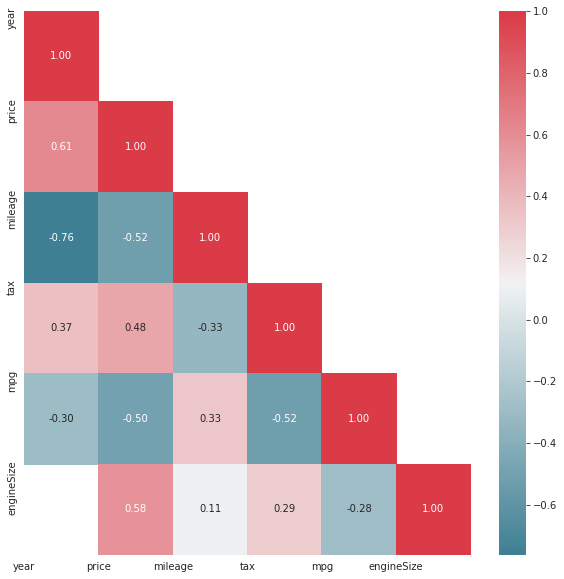


*** ↓↓↓ p_values (%99): ↓↓↓ ***

 [[0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  1.18706108e-306 5.41704111e-001]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 2.12124489e-042]
 [0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 1.00268229e-293]
 [1.18706108e-306 0.00000000e+000 0.00000000e+000 0.00000000e+000
  0.00000000e+000 4.29614449e-265]
 [5.41704111e-001 0.00000000e+000 2.12124489e-042 1.00268229e-293
  4.29614449e-265 0.00000000e+000]]


In [3]:
# Numeric Data for visualization **********************************************

VW_num = VW.select_dtypes(include = ['float64', 'int64'])


# Histogram for Numeric Data***************************************************

fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1,6, figsize = (15,3))

ax1.hist(VW['year'], edgecolor = 'white', align = 'mid')
ax1.set_xlabel('Year')
ax1.set_ylabel('Count')

ax2.hist(VW['price'], edgecolor = 'white', align = 'mid')
ax2.set_xlabel('Price')

ax3.hist(VW['mileage'], edgecolor = 'white', align = 'mid')
ax3.set_xlabel('Milage')

ax4.hist(VW['tax'], edgecolor = 'white', align = 'mid')
ax4.set_xlabel('Tax')

ax5.hist(VW['mpg'], edgecolor = 'white', align = 'mid')
ax5.set_xlabel('MPG')

ax6.hist(VW['engineSize'], edgecolor = 'white', align = 'mid')
ax6.set_xlabel('Engine Size')

plt.tight_layout()
plt.show()


# Histogram for Categorical Data************************************************

plt.figure(figsize=(15, 4))

plt.subplot(1,3,1)
plt1 = VW.model.value_counts().plot(kind='bar')
plt.title('Car model Histogram')
plt1.set(xlabel = 'Car model', ylabel='Amounts of company')

plt.subplot(1,3,2)
plt1 = VW.fuelType.value_counts().plot(kind='bar')
plt.title('Fuel Type Histogram')
plt1.set(xlabel = 'Fuel Type', ylabel='Amounts of fuel type')

plt.subplot(1,3,3)
plt1 = VW.transmission.value_counts().plot(kind='bar')
plt.title('Car transmission Histogram')
plt1.set(xlabel = 'Car Type', ylabel='Amounts of Car type')

plt.show()


# Some Specific Visualization Just on Target Data******************************

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.title('Car Price Distribution Plot')
sns.distplot(VW.price)

plt.subplot(1,2,2)
plt.title('Car Price Spread')
sns.boxplot(y=VW.price)

plt.show()


# Data scaling before plotting them against price (y) *************************

min_max_scaler = preprocessing.MinMaxScaler()
column_sels = ['year','mileage', 'tax', 'mpg', 'engineSize'] 
x = VW_num.loc[:,column_sels]
y = VW_num['price']
x = pd.DataFrame(data=min_max_scaler.fit_transform(x), columns=column_sels)
fig, axs = plt.subplots(ncols=5, nrows=1, figsize=(15, 3))
index = 0
axs = axs.flatten()
for i, k in enumerate(column_sels):
    sns.regplot(y=y, x=x[k], ax=axs[i])
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)


# Box Plot ********************************************************************

fig, axs = plt.subplots(ncols=6, nrows=1, figsize=(15, 3))
index = 0
axs = axs.flatten()
for k,v in VW_num.items():
    sns.boxplot(y=k, data=VW_num, ax=axs[index])
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)


# Pearson Corr Heat Map with p_values (%99) ***********************************

def corr_sig(VW_num=None):
    p_matrix = np.zeros(shape=(VW_num.shape[1],VW_num.shape[1]))
    for col in VW_num.columns:
        for col2 in VW_num.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(VW_num[col],VW_num[col2])
            p_matrix[VW_num.columns.to_list().index(col),VW_num.columns.to_list().index(col2)] = p
    return p_matrix

p_values = corr_sig(VW_num)
mask = np.invert(np.tril(p_values<0.01))

corr = VW_num.corr()
fig, ax = plt.subplots(figsize=(10, 10))

cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr, cmap=cmap, mask=mask, annot=True, fmt=".2f")
plt.xticks(range(len(corr.columns)), corr.columns);
plt.yticks(range(len(corr.columns)), corr.columns)
plt.show()

print('\n'"*** ↓↓↓ p_values (%99): ↓↓↓ ***"'\n''\n',p_values)


## Preprocessing for Regression Analysis

### 1) Encoding Categorical Data

In [4]:
import category_encoders as ce

VW = pd.read_csv('vw.csv')


# Method (1), Dummy Coding **********************************************************************
VW_encoder1=pd.get_dummies(data=VW,drop_first=False)
# list(VW_encoded1.columns) why this does not show all of the column's names?


# Method (2), One Hot Encoder *******************************************************************
encoder=ce.OneHotEncoder(cols=('model','transmission','fuelType'),handle_unknown='return_nan', return_df=True, use_cat_names=True)
VW_encoded2 = encoder.fit_transform(VW)
#list(VW_encoded2.columns) 

### 2) Skewness for non-Gaussian Data

In [5]:
for col in VW_encoder1.columns:
    if np.abs(VW_encoder1[col].skew()) > 0.3:
        #print(col,dataset[col].skew())
        VW_encoder1[col] = np.log1p(VW_encoder1[col])

X = VW_encoder1.drop(['price'], axis=1)
y = np.array(VW_encoder1['price']).reshape(-1,1)

### 3) Splitting Dataset into the Training-set and Test-set

In [6]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 25)

print("Shape of X_train: ",X_train.shape)
print("Shape of X_test: ", X_test.shape)
print("Shape of y_train: ",y_train.shape)
print("Shape of y_test",y_test.shape)

Shape of X_train:  (10609, 39)
Shape of X_test:  (4548, 39)
Shape of y_train:  (10609, 1)
Shape of y_test (4548, 1)


## Regression Analysis

### 1) Linear Regression

In [7]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

regressor_linear = LinearRegression()
regressor_linear.fit(X_train, y_train)


# Predicting Cross Validation Score the Test set results
cv_linear = cross_val_score(estimator = regressor_linear, X = X_train, y = y_train, cv = 10)

# Predicting R2 Score the Train set results
y_pred_linear_train = regressor_linear.predict(X_train)
r2_score_linear_train = r2_score(y_train, y_pred_linear_train)

# Predicting R2 Score the Test set results
y_pred_linear_test = regressor_linear.predict(X_test)
r2_score_linear_test = r2_score(y_test, y_pred_linear_test)

# Predicting RMSE the Test set results
rmse_linear = (np.sqrt(mean_squared_error(y_test, y_pred_linear_test)))
print("CV: ", cv_linear.mean())
print('R2_score (train): ', r2_score_linear_train)
print('R2_score (test): ', r2_score_linear_test)
print("RMSE: ", rmse_linear)

CV:  0.9137204200797993
R2_score (train):  0.9151823808028252
R2_score (test):  0.918675537310089
RMSE:  0.13545554528337317


### 2) Polynomial Regression - 2nd degree

In [8]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score

poly_reg = PolynomialFeatures(degree = 2)
X_poly = poly_reg.fit_transform(X_train)
poly_reg.fit(X_poly, y_train)
regressor_poly2 = LinearRegression()
regressor_poly2.fit(X_poly, y_train)


# Predicting Cross Validation Score the Test set results
cv_poly2 = cross_val_score(estimator = regressor_poly2, X = X_train, y = y_train, cv = 10)

# Predicting R2 Score the Train set results
y_pred_poly2_train = regressor_poly2.predict(poly_reg.fit_transform(X_train))
r2_score_poly2_train = r2_score(y_train, y_pred_poly2_train)

# Predicting R2 Score the Test set results
y_pred_poly2_test = regressor_poly2.predict(poly_reg.fit_transform(X_test))
r2_score_poly2_test = r2_score(y_test, y_pred_poly2_test)

# Predicting RMSE the Test set results
rmse_poly2 = (np.sqrt(mean_squared_error(y_test, y_pred_poly2_test)))
print('CV: ', cv_poly2.mean())
print('R2_score (train): ', r2_score_poly2_train)
print('R2_score (test): ', r2_score_poly2_test)
print("RMSE: ", rmse_poly2)


CV:  0.9137204200797993
R2_score (train):  0.9517282607394214
R2_score (test):  -11491964.275796251
RMSE:  1610.213042815257


### 3) Ridge Regression

In [9]:
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score

steps = [
    ('scalar', StandardScaler()),
    ('poly', PolynomialFeatures(degree=2)),
    ('model', Ridge(alpha=3.8, fit_intercept=True))
]

ridge_pipe = Pipeline(steps)
ridge_pipe.fit(X_train, y_train)


# Predicting Cross Validation Score the Test set results
cv_ridge = cross_val_score(estimator = ridge_pipe, X = X_train, y = y_train.ravel(), cv = 10)

# Predicting R2 Score the Test set results
y_pred_ridge_train = ridge_pipe.predict(X_train)
r2_score_ridge_train = r2_score(y_train, y_pred_ridge_train)

# Predicting R2 Score the Test set results
y_pred_ridge_test = ridge_pipe.predict(X_test)
r2_score_ridge_test = r2_score(y_test, y_pred_ridge_test)

# Predicting RMSE the Test set results
rmse_ridge = (np.sqrt(mean_squared_error(y_test, y_pred_ridge_test)))
print('CV: ', cv_ridge.mean())
print('R2_score (train): ', r2_score_ridge_train)
print('R2_score (test): ', r2_score_ridge_test)
print("RMSE: ", rmse_ridge)

CV:  0.9206253798208621
R2_score (train):  0.951706198878003
R2_score (test):  0.9454223179511579
RMSE:  0.11096697088721433


### 4) Lasso Regression

In [10]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score

steps = [
    ('scalar', StandardScaler()),
    ('poly', PolynomialFeatures(degree=2)),
    ('model', Lasso(alpha=0.012, fit_intercept=True, max_iter=3000))
]

lasso_pipe = Pipeline(steps)
lasso_pipe.fit(X_train, y_train)


# Predicting Cross Validation Score
cv_lasso = cross_val_score(estimator = lasso_pipe, X = X_train, y = y_train, cv = 10)

# Predicting R2 Score the Test set results
y_pred_lasso_train = lasso_pipe.predict(X_train)
r2_score_lasso_train = r2_score(y_train, y_pred_lasso_train)

# Predicting R2 Score the Test set results
y_pred_lasso_test = lasso_pipe.predict(X_test)
r2_score_lasso_test = r2_score(y_test, y_pred_lasso_test)

# Predicting RMSE the Test set results
rmse_lasso = (np.sqrt(mean_squared_error(y_test, y_pred_lasso_test)))
print('CV: ', cv_lasso.mean())
print('R2_score (train): ', r2_score_lasso_train)
print('R2_score (test): ', r2_score_lasso_test)
print("RMSE: ", rmse_lasso)


CV:  0.9108130066792282
R2_score (train):  0.9289184007421035
R2_score (test):  0.9314895791771862
RMSE:  0.12432672829787264


In [17]:
# Loop for Changing Lasso Regression Parameters

from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score

for step in range(4):
    iter= 20000 * (step+1)
    for i in range(10):
        alpha= 0.01+(i*0.02)


        steps = [
            ('scalar', StandardScaler()),
            ('poly', PolynomialFeatures(degree=2)),
            ('model', Lasso(alpha=alpha, fit_intercept=True, max_iter=iter))
        ]

        lasso_pipe = Pipeline(steps)
        lasso_pipe.fit(X_train, y_train)


        # Predicting Cross Validation Score
        cv_lasso = cross_val_score(estimator = lasso_pipe, X = X_train, y = y_train, cv = 10)

        # Predicting R2 Score the Test set results
        y_pred_lasso_train = lasso_pipe.predict(X_train)
        r2_score_lasso_train = r2_score(y_train, y_pred_lasso_train)

    # Predicting R2 Score the Test set results
        y_pred_lasso_test = lasso_pipe.predict(X_test)
        r2_score_lasso_test = r2_score(y_test, y_pred_lasso_test)

# Predicting RMSE the Test set results
        rmse_lasso = (np.sqrt(mean_squared_error(y_test, y_pred_lasso_test)))

        print('max iter: ', iter)
        print('alpha: ', alpha)
        print('CV: ', cv_lasso.mean())
        print('R2_score (train): ', r2_score_lasso_train)
        print('R2_score (test): ', r2_score_lasso_test)
        print("RMSE: ", rmse_lasso)
        print("")

max iter:  20000
alpha:  0.01
CV:  0.9129387381296381
R2_score (train):  0.9321206556058698
R2_score (test):  0.9344784046504934
RMSE:  0.12158455769807379

max iter:  20000
alpha:  0.03
CV:  0.8912095802355438
R2_score (train):  0.9031075817487643
R2_score (test):  0.9067188738958236
RMSE:  0.14507182609027705

max iter:  20000
alpha:  0.05
CV:  0.8734209608425332
R2_score (train):  0.8798460265392902
R2_score (test):  0.8834214641782729
RMSE:  0.16217932399368204

max iter:  20000
alpha:  0.06999999999999999
CV:  0.8455178987389061
R2_score (train):  0.8486754454002826
R2_score (test):  0.853096896066345
RMSE:  0.1820546070788133

max iter:  20000
alpha:  0.09
CV:  0.8076714360505513
R2_score (train):  0.8096285668393879
R2_score (test):  0.8154157594327465
RMSE:  0.20407203587841297

max iter:  20000
alpha:  0.11
CV:  0.7646194219678554
R2_score (train):  0.7667235404958276
R2_score (test):  0.77437137966932
RMSE:  0.22562295426549153

max iter:  20000
alpha:  0.13
CV:  0.7204283735

### 5) Support Vector Regression 

In [11]:
# Feature Scaling
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.metrics import r2_score

sc_X = StandardScaler()
sc_y = StandardScaler()
X_scaled = sc_X.fit_transform(X_train)
y_scaled = sc_y.fit_transform(y_train.reshape(-1,1))


# Fitting the SVR Model to the dataset

regressor_svr = SVR(kernel = 'rbf', gamma = 'scale')
regressor_svr.fit(X_scaled, y_scaled.ravel())


# Predicting Cross Validation Score
cv_svr = cross_val_score(estimator = regressor_svr, X = X_scaled, y = y_scaled.ravel(), cv = 10)

# Predicting R2 Score the Train set results
y_pred_svr_train = sc_y.inverse_transform(regressor_svr.predict(sc_X.transform(X_train)))
r2_score_svr_train = r2_score(y_train, y_pred_svr_train)

# Predicting R2 Score the Test set results
y_pred_svr_test = sc_y.inverse_transform(regressor_svr.predict(sc_X.transform(X_test)))
r2_score_svr_test = r2_score(y_test, y_pred_svr_test)

# Predicting RMSE the Test set results
rmse_svr = (np.sqrt(mean_squared_error(y_test, y_pred_svr_test)))
print('CV: ', cv_svr.mean())
print('R2_score (train): ', r2_score_svr_train)
print('R2_score (test): ', r2_score_svr_test)
print("RMSE: ", rmse_svr)

CV:  0.9445180934680127
R2_score (train):  0.9536203339940006
R2_score (test):  0.9368666386867713
RMSE:  0.11934813690813822


### 6) Decision Tree Regression

In [12]:
# Fitting the Decision Tree Regression Model to the dataset
from sklearn.tree import DecisionTreeRegressor
regressor_dt = DecisionTreeRegressor(random_state = 0)
regressor_dt.fit(X_train, y_train)

from sklearn.metrics import r2_score

# Predicting Cross Validation Score
cv_dt = cross_val_score(estimator = regressor_dt, X = X_train, y = y_train, cv = 10)

# Predicting R2 Score the Train set results
y_pred_dt_train = regressor_dt.predict(X_train)
r2_score_dt_train = r2_score(y_train, y_pred_dt_train)

# Predicting R2 Score the Test set results
y_pred_dt_test = regressor_dt.predict(X_test)
r2_score_dt_test = r2_score(y_test, y_pred_dt_test)

# Predicting RMSE the Test set results
rmse_dt = (np.sqrt(mean_squared_error(y_test, y_pred_dt_test)))
print('CV: ', cv_dt.mean())
print('R2_score (train): ', r2_score_dt_train)
print('R2_score (test): ', r2_score_dt_test)
print("RMSE: ", rmse_dt)


CV:  0.9273407435858338
R2_score (train):  0.999476038226637
R2_score (test):  0.9329876575635442
RMSE:  0.12295992430868814


### 7) Random Forest Regression

In [13]:
# Fitting the Random Forest Regression to the dataset
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

regressor_rf = RandomForestRegressor(n_estimators = 10, random_state = 0)
regressor_rf.fit(X_train, y_train.ravel())


# Predicting Cross Validation Score
cv_rf = cross_val_score(estimator = regressor_rf, X = X_scaled, y = y_train.ravel(), cv = 10)

# Predicting R2 Score the Train set results
y_pred_rf_train = regressor_rf.predict(X_train)
r2_score_rf_train = r2_score(y_train, y_pred_rf_train)

# Predicting R2 Score the Test set results
y_pred_rf_test = regressor_rf.predict(X_test)
r2_score_rf_test = r2_score(y_test, y_pred_rf_test)

# Predicting RMSE the Test set results
rmse_rf = (np.sqrt(mean_squared_error(y_test, y_pred_rf_test)))
print('CV: ', cv_rf.mean())
print('R2_score (train): ', r2_score_rf_train)
print('R2_score (test): ', r2_score_rf_test)
print("RMSE: ", rmse_rf)


CV:  0.9540152956291141
R2_score (train):  0.9921933773550736
R2_score (test):  0.9547192027467177
RMSE:  0.10107487665229284


In [16]:
# Loop for Changing Random ForestParameters

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score


for i in range(5):
    n_estimator = (i+1) *5
    regressor_rf = RandomForestRegressor(n_estimators = n_estimator, random_state = 0)
    regressor_rf.fit(X_train, y_train.ravel())


# Predicting Cross Validation Score
    cv_rf = cross_val_score(estimator = regressor_rf, X = X_scaled, y = y_train.ravel(), cv = 10)

# Predicting R2 Score the Train set results
    y_pred_rf_train = regressor_rf.predict(X_train)
    r2_score_rf_train = r2_score(y_train, y_pred_rf_train)

# Predicting R2 Score the Test set results
    y_pred_rf_test = regressor_rf.predict(X_test)
    r2_score_rf_test = r2_score(y_test, y_pred_rf_test)

# Predicting RMSE the Test set results
    rmse_rf = (np.sqrt(mean_squared_error(y_test, y_pred_rf_test)))
    print('N. of estimators: ', n_estimator)

    print('CV: ', cv_rf.mean())
    print('R2_score (train): ', r2_score_rf_train)
    print('R2_score (test): ', r2_score_rf_test)
    print("RMSE: ", rmse_rf)
    print("")

N. of estimators:  5
CV:  0.9498628970308276
R2_score (train):  0.9892791752272325
R2_score (test):  0.952576375604899
RMSE:  0.1034388202726628

N. of estimators:  10
CV:  0.9539981828655388
R2_score (train):  0.9921909515527234
R2_score (test):  0.9558270470454375
RMSE:  0.09983076611793194

N. of estimators:  15
CV:  0.9558607068405591
R2_score (train):  0.99280291467532
R2_score (test):  0.9570819074631056
RMSE:  0.0984025592096594

N. of estimators:  20
CV:  0.9566659817758059
R2_score (train):  0.9931604079336622
R2_score (test):  0.9576063464361788
RMSE:  0.09779949468174444

N. of estimators:  25
CV:  0.9568126689014456
R2_score (train):  0.993443457535801
R2_score (test):  0.9582654603530331
RMSE:  0.09703624923385615



## Measuring the Error

In [14]:
models = [('Linear Regression', rmse_linear, r2_score_linear_train, r2_score_linear_test, cv_linear.mean()),
          ('Polynomial Regression (2nd)', rmse_poly2, r2_score_poly2_train, r2_score_poly2_test, cv_poly2.mean()),
          ('Ridge Regression', rmse_ridge, r2_score_ridge_train, r2_score_ridge_test, cv_ridge.mean()),
          ('Lasso Regression', rmse_lasso, r2_score_lasso_train, r2_score_lasso_test, cv_lasso.mean()),
          ('Support Vector Regression', rmse_svr, r2_score_svr_train, r2_score_svr_test, cv_svr.mean()),
          ('Decision Tree Regression', rmse_dt, r2_score_dt_train, r2_score_dt_test, cv_dt.mean()),
          ('Random Forest Regression', rmse_rf, r2_score_rf_train, r2_score_rf_test, cv_rf.mean())   
         ]

predict = pd.DataFrame(data = models, columns=['Model', 'RMSE', 'R2_Score(training)', 'R2_Score(test)', 'Cross-Validation'])
predict

,Model,RMSE,R2_Score(training),R2_Score(test),Cross-Validation
0,Linear Regression,0.135456,0.915182,9.186755e-01,0.913720
1,Polynomial Regression (2nd),1610.213043,0.951728,-1.149196e+07,0.913720
2,Ridge Regression,0.110967,0.951706,9.454223e-01,0.920625
3,Lasso Regression,0.124327,0.928918,9.314896e-01,0.910813
4,Support Vector Regression,0.119348,0.953620,9.368666e-01,0.944518
5,Decision Tree Regression,0.122960,0.999476,9.329877e-01,0.927341
6,Random Forest Regression,0.101075,0.992193,9.547192e-01,0.954015


## Visualizing Model Performance 

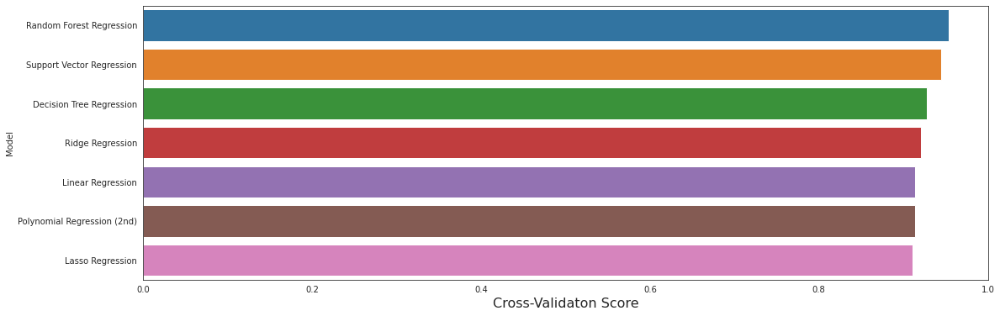

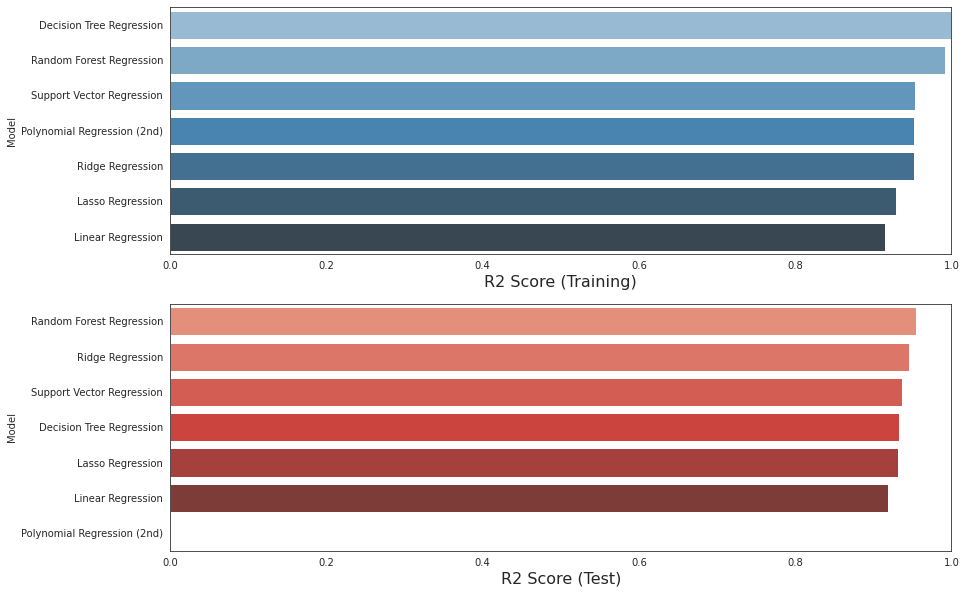

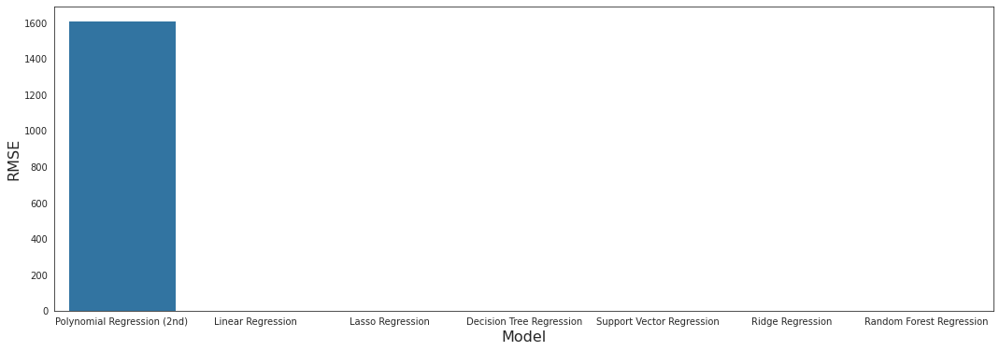

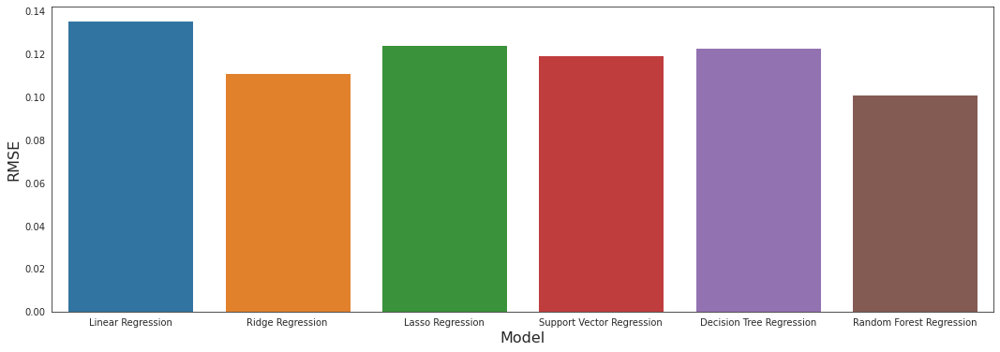

In [15]:
# Cross-Validation Visualization ***********************************************************

f, axe = plt.subplots(1,1, figsize=(18,6))

predict.sort_values(by=['Cross-Validation'], ascending=False, inplace=True)

sns.barplot(x='Cross-Validation', y='Model', data = predict, ax = axe)
#axes[0].set(xlabel='Region', ylabel='Charges')
axe.set_xlabel('Cross-Validaton Score', size=16)
axe.set_ylabel('Model')
axe.set_xlim(0,1.0)
plt.show()


# R2 Score Visualization ******************************************************************

f, axes = plt.subplots(2,1, figsize=(14,10))

predict.sort_values(by=['R2_Score(training)'], ascending=False, inplace=True)

sns.barplot(x='R2_Score(training)', y='Model', data = predict, palette='Blues_d', ax = axes[0])
#axes[0].set(xlabel='Region', ylabel='Charges')
axes[0].set_xlabel('R2 Score (Training)', size=16)
axes[0].set_ylabel('Model')
axes[0].set_xlim(0,1.0)

predict.sort_values(by=['R2_Score(test)'], ascending=False, inplace=True)

sns.barplot(x='R2_Score(test)', y='Model', data = predict, palette='Reds_d', ax = axes[1])
#axes[0].set(xlabel='Region', ylabel='Charges')
axes[1].set_xlabel('R2 Score (Test)', size=16)
axes[1].set_ylabel('Model')
axes[1].set_xlim(0,1.0)

plt.show()


# RMSE Visualization *********************************************************************

predict.sort_values(by=['RMSE'], ascending=False, inplace=True)

f, axe = plt.subplots(1,1, figsize=(18,6))
sns.barplot(x='Model', y='RMSE', data=predict, ax = axe)
axe.set_xlabel('Model', size=16)
axe.set_ylabel('RMSE', size=16)

plt.show()


# Removing Out of Range Polynomial Regression ********************************************

models_withoutpoly = [('Linear Regression', rmse_linear),
         # ('Polynomial Regression (2nd)', rmse_poly2, r2_score_poly2_train, r2_score_poly2_test, cv_poly2.mean()),
          ('Ridge Regression', rmse_ridge),
          ('Lasso Regression', rmse_lasso),
          ('Support Vector Regression', rmse_svr),
          ('Decision Tree Regression', rmse_dt),
          ('Random Forest Regression', rmse_rf)   
         ]

predict_withoutpoly = pd.DataFrame(data = models_withoutpoly, columns=['Model', 'RMSE'])

predict.sort_values(by=['RMSE'], ascending=False, inplace=True)

f, axe = plt.subplots(1,1, figsize=(18,6))
sns.barplot(x='Model', y='RMSE', data=predict_withoutpoly, ax = axe)
axe.set_xlabel('Model', size=16)
axe.set_ylabel('RMSE', size=16)

plt.show()


# The best regression model for this data set is "Random Forest Regression"

In [16]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

regressor_rf = RandomForestRegressor(n_estimators = 10, random_state = 0)
regressor_rf.fit(X_train, y_train.ravel())
regressor_rf.feature_importances_

array([4.57447240e-01, 8.70329735e-02, 6.80197932e-03, 1.48538587e-01,
       2.26106509e-01, 6.33500433e-04, 8.78031640e-04, 3.82964055e-04,
       4.24587452e-04, 3.52898789e-05, 1.34262793e-04, 8.63924451e-08,
       3.98895423e-04, 8.01936065e-04, 2.89414725e-03, 1.27144378e-05,
       5.04126201e-05, 2.42646223e-03, 6.81485090e-04, 5.90680830e-04,
       1.61145072e-03, 5.82124523e-03, 9.45189036e-04, 2.61038305e-04,
       5.51589287e-04, 5.17409124e-04, 2.19611247e-03, 2.75817894e-03,
       1.21763809e-04, 2.17949047e-03, 2.53845320e-03, 2.89072428e-02,
       1.05849263e-03, 5.21199711e-03, 1.48657581e-03, 2.72869272e-03,
       8.17291919e-04, 6.36837984e-05, 3.95135772e-03])